In [174]:
# Ispirato dal video https://youtu.be/YtsDTSdGP00?si=RDHSIox7GTUdoMim

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools

### Lettura dati

In [197]:
# dati = pd.read_csv('Bitcoin (€) da yfinance dal 17-09-2014 al 24-04-2024.csv')
# dati.rename(columns={'Date':'Timestamp', 'Close':'Price'}, inplace=True)
# dati['Timestamp'] = pd.to_datetime(dati['Timestamp']).dt.tz_localize(None)
# dati = dati[['Timestamp', 'Price']]
# dati

dati = pd.read_csv('Bitcoin (€) da yfinance dal 06-05-2022 alle 21 al 05-05-2024 alle 19 con granularità oraria.csv')
dati.rename(columns={'Datetime':'Timestamp', 'Close':'Price'}, inplace=True)
dati['Timestamp'] = pd.to_datetime(dati['Timestamp']).dt.tz_localize(None)
dati = dati[['Timestamp', 'Price']]
dati

,Timestamp,Price
0,2022-05-06 21:00:00,34112.898438
1,2022-05-06 22:00:00,34170.894531
2,2022-05-06 23:00:00,34176.558594
3,2022-05-07 00:00:00,34143.449219
4,2022-05-07 01:00:00,34148.765625
...,...,...
17390,2024-05-05 15:00:00,59858.859375
17391,2024-05-05 16:00:00,59701.378906
17392,2024-05-05 17:00:00,59626.519531
17393,2024-05-05 18:00:00,59369.429688


<h6> Scelta periodo </h6>

In [198]:
# data_inizio = '2021-01-09'
# data_fine = '2023-12-03'

# # Filtra i dati nel range di date desiderato
# dati = dati[(dati['Timestamp'] >= data_inizio) & (dati['Timestamp'] <= data_fine)].reset_index(drop=True).copy()
# dati

data_inizio = '2022-05-06 21:00:00'
data_fine = '2022-05-09 21:00:00'

# Filtra i dati nel range di date desiderato
dati = dati[(dati['Timestamp'] >= data_inizio) & (dati['Timestamp'] <= data_fine)].reset_index(drop=True).copy()
dati

,Timestamp,Price
0,2022-05-06 21:00:00,34112.898438
1,2022-05-06 22:00:00,34170.894531
2,2022-05-06 23:00:00,34176.558594
3,2022-05-07 00:00:00,34143.449219
4,2022-05-07 01:00:00,34148.765625
...,...,...
68,2022-05-09 17:00:00,29783.789062
69,2022-05-09 18:00:00,29310.658203
70,2022-05-09 19:00:00,29244.712891
71,2022-05-09 20:00:00,29530.732422


<h6> Grafico del periodo scelto </h6>

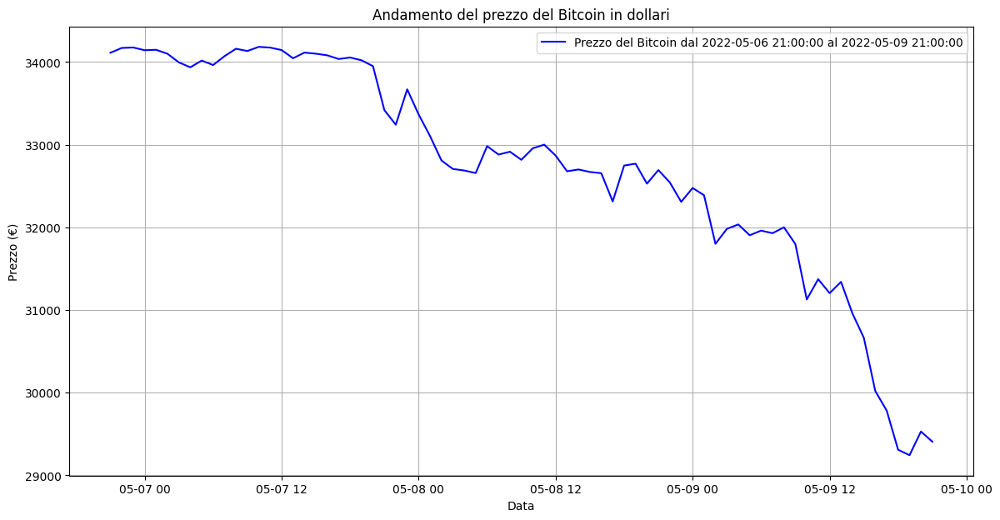

In [199]:
x = dati['Timestamp']
y = dati['Price']

plt.figure(figsize=(14, 7))
plt.plot(x, y, label=f"Prezzo del Bitcoin dal {str(x.iloc[0])} al {str(x.iloc[-1])}", color='blue')
plt.title('Andamento del prezzo del Bitcoin in dollari')
plt.xlabel('Data')
plt.ylabel('Prezzo (€)')
plt.legend()
plt.grid(True)
plt.show()

<h6> Grafico del prezzo insieme alle medie mobili </h6>

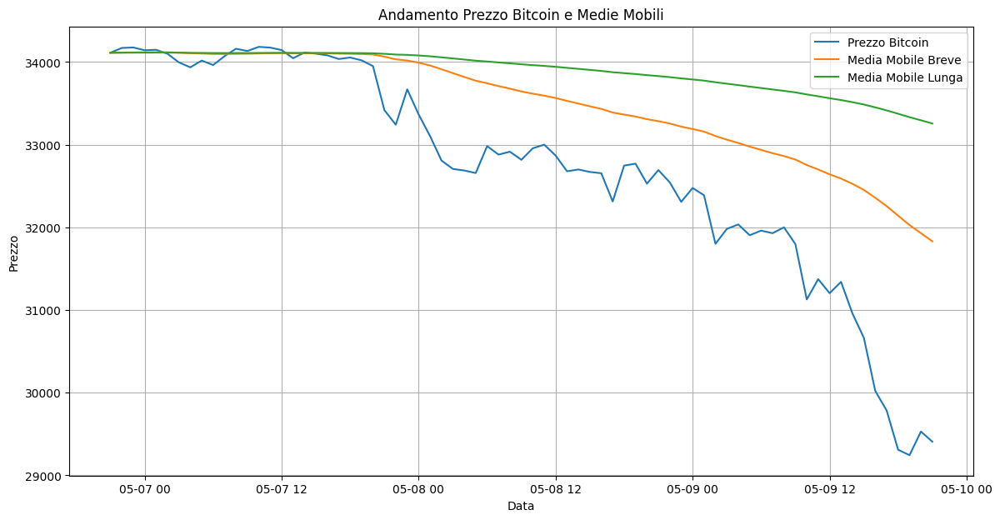

In [200]:
# Numero di giorni per le medie mobili breve e lunga
n_giorni_breve = 50
n_giorni_lunga = 200

# Variabili booleane per decidere se calcolare la media mobile esponenziale (True) o semplice (False)
esponenziale_breve = True
esponenziale_lunga = True

# Calcolo delle medie mobili
if esponenziale_breve:
    dati['Media Mobile Breve'] = dati['Price'].ewm(span=n_giorni_breve, adjust=False).mean()
else:
    dati['Media Mobile Breve'] = dati['Price'].rolling(window=n_giorni_breve).mean()

if esponenziale_lunga:
    dati['Media Mobile Lunga'] = dati['Price'].ewm(span=n_giorni_lunga, adjust=False).mean()
else:
    dati['Media Mobile Lunga'] = dati['Price'].rolling(window=n_giorni_lunga).mean()

# Creazione del grafico
plt.figure(figsize=(14,7))
plt.plot(dati['Timestamp'], dati['Price'], label='Prezzo Bitcoin')
plt.plot(dati['Timestamp'], dati['Media Mobile Breve'], label='Media Mobile Breve')
plt.plot(dati['Timestamp'], dati['Media Mobile Lunga'], label='Media Mobile Lunga')
plt.title('Andamento Prezzo Bitcoin e Medie Mobili')
plt.xlabel('Data')
plt.ylabel('Prezzo')
plt.legend()
plt.grid(True)
plt.show()

In [201]:
def calcola_RSI(prezzi):
    variazioni = np.diff(prezzi)
    variazioni_positive = [i for i in variazioni if i >= 0]
    variazioni_negative = [i for i in variazioni if i < 0]
    if variazioni_positive == []:
        variazioni_positive.append(0)
    if variazioni_negative == []:
        variazioni_negative.append(0)
    P = np.array(variazioni_positive).mean()
    N = -np.array(variazioni_negative).mean()
    rsi = P / (P + N)
    return rsi

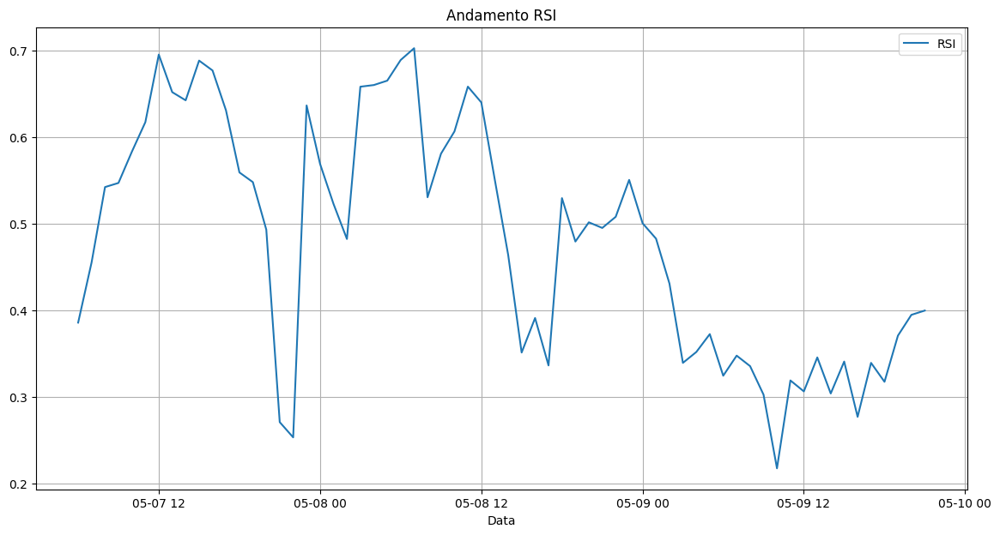

In [202]:
n_giorni_RSI = 10
valori_RSI = dati['Price'].rolling(window = n_giorni_RSI).apply(calcola_RSI, raw=True) # raw=True fa sì che la funzione calcola_RSI riceva un array numpy invece di una serie pandas, che è necessario per utilizzare np.diff()

plt.figure(figsize=(14,7))
plt.plot(dati['Timestamp'], valori_RSI, label='RSI')
plt.title('Andamento RSI')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()

### Simulazione singola

In [203]:
# Prova calcolo EMA
prova = pd.Series([2,5,32,1000, 1000, 1000, 1000, 350]) 
prova.ewm(span=5, adjust=False).mean() # adjust=False significa che α viene calcolato come α = 2/(N+1) (valore predefinito, dove N è lo span); la formula che calcola la media mobile esponenziale è EMA_t = (1 - α) EMA_(t-1) + α P_t, dove P_t è il prezzo attuale

0      2.000000
1      3.000000
2     12.666667
3    341.777778
4    561.185185
5    707.456790
6    804.971193
7    653.314129
dtype: float64

In [216]:
# Parametri fissi
capitale = 1000
bitcoins = 0
ultima_azione = 'Vendita'

# Parametri variabili
scarto_sotto = -0.05
scarto_sopra = -0.1
perc_acquisto = 1
perc_vendita = 1
timeframe = 1
n_giorni_breve = 10
n_giorni_lunga = 100
n_giorni_RSI = 24
soglia_RSI_superiore = 0.6
soglia_RSI_inferiore = 0.4
esponenziale_breve = True # Se è True viene usata la media mobile esponenziale, altrimenti quella semplice
esponenziale_lunga = False

# Calcolo delle medie mobili e dell'RSI
if esponenziale_breve:
    dati['Media Mobile Breve'] = dati['Price'].ewm(span=n_giorni_breve, adjust=False).mean()
else:
    dati['Media Mobile Breve'] = dati['Price'].rolling(window=n_giorni_breve).mean()

if esponenziale_lunga:
    dati['Media Mobile Lunga'] = dati['Price'].ewm(span=n_giorni_lunga, adjust=False).mean()
else:
    dati['Media Mobile Lunga'] = dati['Price'].rolling(window=n_giorni_lunga).mean()

dati['RSI'] = dati['Price'].rolling(window=n_giorni_RSI).apply(calcola_RSI, raw=True)

# Simulazione della strategia di trading
azioni = []
ultime_azioni = []
quantita_euro = []
quantita_bitcoin = []
capitale_lista = []
bitcoins_lista = []
valore_bitcoin_lista = []
portafoglio_lista = []
valore_quantita_euro = 0
valore_quantita_bitcoin = 0
azione = '-'
acquisti_fatti = 0
vendite_fatte = 0

for i in range(n_giorni_RSI, len(dati)):
    if i % timeframe == 0:
        if dati['Media Mobile Breve'].iloc[i] > dati['Media Mobile Lunga'].iloc[i] * (1 + scarto_sopra) and dati['RSI'].iloc[i] < soglia_RSI_inferiore and ultima_azione == 'Vendita':
            prezzo_acquisto = dati['Price'].iloc[i]
            bitcoins_acquistati = (capitale * perc_acquisto) / prezzo_acquisto
            capitale -= prezzo_acquisto * bitcoins_acquistati
            bitcoins += bitcoins_acquistati
            azione = 'Acquisto'
            acquisti_fatti += 1
            ultima_azione = azione
            valore_quantita_euro = prezzo_acquisto * bitcoins_acquistati
            valore_quantita_bitcoin = bitcoins_acquistati
        elif dati['Media Mobile Breve'].iloc[i] < dati['Media Mobile Lunga'].iloc[i] * (1 - scarto_sotto) and dati['RSI'].iloc[i] > soglia_RSI_superiore and ultima_azione == 'Acquisto' and dati['Price'].iloc[i] > prezzo_acquisto:
            prezzo_vendita = dati['Price'].iloc[i]
            bitcoins_venduti = bitcoins * perc_vendita
            capitale += prezzo_vendita * bitcoins_venduti
            bitcoins -= bitcoins_venduti
            azione = 'Vendita'
            vendite_fatte += 1
            ultima_azione = azione
            valore_quantita_euro = prezzo_vendita * bitcoins_venduti
            valore_quantita_bitcoin = bitcoins_venduti
        else:
            azione = '-'
            valore_quantita_euro = 0
            valore_quantita_bitcoin = 0
    else:
        azione = '-'
        valore_quantita_euro = 0
        valore_quantita_bitcoin = 0

    azioni.append(azione)
    ultime_azioni.append(ultima_azione)
    quantita_euro.append(valore_quantita_euro)
    quantita_bitcoin.append(valore_quantita_bitcoin)
    capitale_lista.append(capitale)
    bitcoins_lista.append(bitcoins)
    valore_bitcoin_lista.append(bitcoins * dati['Price'].iloc[i])
    portafoglio_lista.append(capitale + bitcoins * dati['Price'].iloc[i])

rendimento_portafoglio = portafoglio_lista[-1] / portafoglio_lista[0]

tabella_finale = pd.DataFrame({
    'Data': dati['Timestamp'].iloc[n_giorni_RSI:],
    'Prezzo Bitcoin (€)': dati['Price'].iloc[n_giorni_RSI:],
    'Media Mobile Breve': dati['Media Mobile Breve'].iloc[n_giorni_RSI:],
    'Media Mobile Lunga': dati['Media Mobile Lunga'].iloc[n_giorni_RSI:],
    'RSI': dati['RSI'].iloc[n_giorni_RSI:],
    'Azione': azioni,
    'Ultima azione': ultime_azioni,
    '€ acquistati/venduti': quantita_euro,
    'Quantità Bitcoin': quantita_bitcoin,
    'Capitale (€)': capitale_lista,
    'Bitcoin posseduti': bitcoins_lista,
    'Valore Bitcoin (€)': valore_bitcoin_lista,
    'Portafoglio totale (€)': portafoglio_lista
})

In [217]:
acquisti_fatti, vendite_fatte

(0, 0)

In [218]:
tabella_finale

,Data,Prezzo Bitcoin (€),Media Mobile Breve,Media Mobile Lunga,RSI,Azione,Ultima azione,€ acquistati/venduti,Quantità Bitcoin,Capitale (€),Bitcoin posseduti,Valore Bitcoin (€),Portafoglio totale (€)
24,2022-05-07 21:00:00,33418.832031,33935.742702,NaN,0.404319,-,Vendita,0,0,1000,0,0.0,1000.0
25,2022-05-07 22:00:00,33242.390625,33809.678688,NaN,0.415256,-,Vendita,0,0,1000,0,0.0,1000.0
26,2022-05-07 23:00:00,33670.449219,33784.364239,NaN,0.546320,-,Vendita,0,0,1000,0,0.0,1000.0
27,2022-05-08 00:00:00,33366.863281,33708.454974,NaN,0.542621,-,Vendita,0,0,1000,0,0.0,1000.0
28,2022-05-08 01:00:00,33104.855469,33598.709609,NaN,0.511792,-,Vendita,0,0,1000,0,0.0,1000.0
29,2022-05-08 02:00:00,32809.691406,33455.251754,NaN,0.487156,-,Vendita,0,0,1000,0,0.0,1000.0
30,2022-05-08 03:00:00,32707.234375,33319.248594,NaN,0.481944,-,Vendita,0,0,1000,0,0.0,1000.0
31,2022-05-08 04:00:00,32688.484375,33204.564191,NaN,0.507915,-,Vendita,0,0,1000,0,0.0,1000.0
32,2022-05-08 05:00:00,32657.589844,33105.114310,NaN,0.510721,-,Vendita,0,0,1000,0,0.0,1000.0
33,2022-05-08 06:00:00,32983.476562,33082.998356,NaN,0.573109,-,Vendita,0,0,1000,0,0.0,1000.0


In [219]:
tabella_finale[tabella_finale['Azione'] != '-']

,Data,Prezzo Bitcoin (€),Media Mobile Breve,Media Mobile Lunga,RSI,Azione,Ultima azione,€ acquistati/venduti,Quantità Bitcoin,Capitale (€),Bitcoin posseduti,Valore Bitcoin (€),Portafoglio totale (€)


In [220]:
print(f'Rendimento del portafoglio: {round(rendimento_portafoglio,2)}')
print(f'Valore medio del portafoglio: {round(np.mean(portafoglio_lista),2)}€')
print(f'Controvalore finale bitcoin: {round(bitcoins_lista[-1] * dati["Price"].iloc[-1],2)}€')
print(f'Capitale finale: {round(capitale_lista[-1],2)}€')

Rendimento del portafoglio: 1.0
Valore medio del portafoglio: 1000.0€
Controvalore finale bitcoin: 0.0€
Capitale finale: 1000€


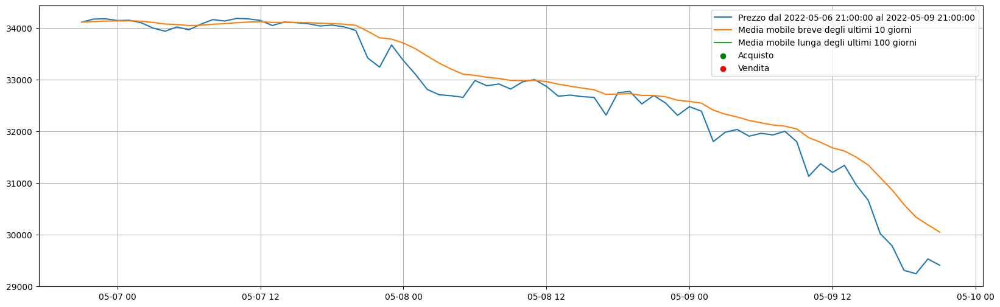

In [221]:
plt.figure(figsize=(20,6))
plt.plot(dati['Timestamp'], dati['Price'], label=f'Prezzo dal {dati["Timestamp"].iloc[0]} al {dati["Timestamp"].iloc[-1]}')
plt.plot(dati['Timestamp'], dati['Media Mobile Breve'], label=f'Media mobile breve degli ultimi {n_giorni_breve} giorni')
plt.plot(dati['Timestamp'], dati['Media Mobile Lunga'], label=f'Media mobile lunga degli ultimi {n_giorni_lunga} giorni')
acquisti = tabella_finale[tabella_finale['Azione'] == 'Acquisto'].index
vendite = tabella_finale[tabella_finale['Azione'] == 'Vendita'].index
plt.scatter(dati['Timestamp'][acquisti], dati['Price'].iloc[acquisti], color='g', marker='o', label='Acquisto')
plt.scatter(dati['Timestamp'][vendite], dati['Price'].iloc[vendite], color='r', marker='o', label='Vendita')
plt.legend()
plt.grid()
plt.show()

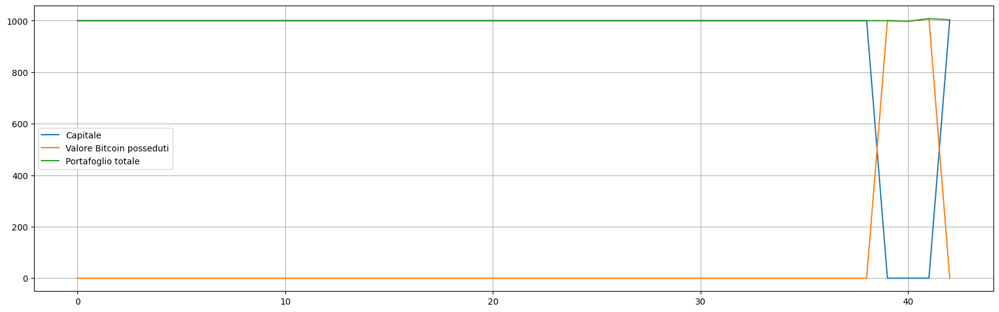

In [210]:
plt.figure(figsize=(20,6))
plt.plot(capitale_lista, label='Capitale')
plt.plot(valore_bitcoin_lista, label='Valore Bitcoin posseduti')
plt.plot(portafoglio_lista, label='Portafoglio totale')
plt.legend()
plt.grid()
plt.show()

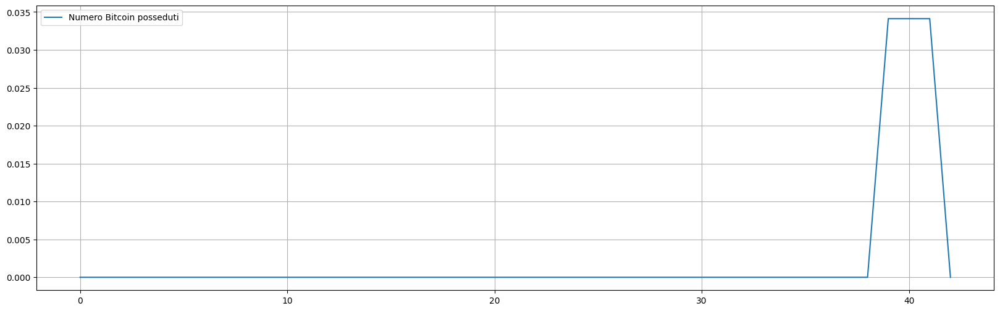

In [211]:
plt.figure(figsize=(20,6))
plt.plot(bitcoins_lista, label='Numero Bitcoin posseduti')
plt.legend()
plt.grid()
plt.show()

### Grid search

In [173]:
pd.set_option('expand_frame_repr', False) # Serve a fare in modo che nelle celle di output le tabelle si vedano su una riga unica e non con gli "a capo"

In [68]:
iterazione_di_partenza = 1
iterazione_di_arrivo = 999999

# Definisci i range dei parametri
scarto_sotto_range = [0.05,0.07, 0.09]
scarto_sopra_range = [-0.12, -0.1, -0.08]
perc_acquisto_range = [1]
perc_vendita_range = [1]
timeframe_range = [3]
n_giorni_breve_range = [10, 15, 20]
n_giorni_lunga_range = [70, 90, 100] # Devono essere tutti maggiori di tutti i valori in n_giorni_breve_range
n_giorni_RSI_range = [25, 30, 35]
soglia_RSI_superiore_range = [0.3, 0.4, 0.5]
soglia_RSI_inferiore_range = [0.35, 0.4, 0.45]
esponenziale_breve_range = [True, False]
esponenziale_lunga_range = [True, False]

# Crea tutte le combinazioni dei parametri
combinazioni = list(itertools.product(
    scarto_sotto_range,
    scarto_sopra_range,
    perc_acquisto_range,
    perc_vendita_range,
    timeframe_range,
    n_giorni_breve_range,
    n_giorni_lunga_range,
    n_giorni_RSI_range,
    soglia_RSI_superiore_range,
    soglia_RSI_inferiore_range,
    esponenziale_breve_range,
    esponenziale_lunga_range
))

# Inizializza la tabella dei risultati
tabella_grid_search = pd.DataFrame()

# Esegui la grid search
for cont, combinazione in enumerate(combinazioni):
    if cont + 1 >= iterazione_di_partenza and cont + 1 <= iterazione_di_arrivo:
        scarto_sotto, scarto_sopra, perc_acquisto, perc_vendita, timeframe, n_giorni_breve, n_giorni_lunga, n_giorni_RSI, soglia_RSI_superiore, soglia_RSI_inferiore, esponenziale_breve, esponenziale_lunga = combinazione
        
        





        # Calcolo delle medie mobili e dell'RSI
        if esponenziale_breve:
            dati['Media Mobile Breve'] = dati['Price'].ewm(span=n_giorni_breve, adjust=False).mean()
        else:
            dati['Media Mobile Breve'] = dati['Price'].rolling(window=n_giorni_breve).mean()

        if esponenziale_lunga:
            dati['Media Mobile Lunga'] = dati['Price'].ewm(span=n_giorni_lunga, adjust=False).mean()
        else:
            dati['Media Mobile Lunga'] = dati['Price'].rolling(window=n_giorni_lunga).mean()

        dati['RSI'] = dati['Price'].rolling(window=n_giorni_RSI).apply(calcola_RSI, raw=True)

        # Simulazione della strategia di trading
        portafoglio_lista = []
        valore_quantita_euro = 0
        valore_quantita_bitcoin = 0
        azione = '-'
        acquisti_fatti = 0
        vendite_fatte = 0

        # Parametri fissi
        capitale = 1000
        bitcoins = 0
        ultima_azione = 'Vendita'

        for i in range(n_giorni_RSI, len(dati)):
            if i % timeframe == 0:
                if dati['Media Mobile Breve'].iloc[i] > dati['Media Mobile Lunga'].iloc[i] * (1 + scarto_sopra) and dati['RSI'].iloc[i] < soglia_RSI_inferiore and ultima_azione == 'Vendita':
                    prezzo_acquisto = dati['Price'].iloc[i]
                    bitcoins_acquistati = (capitale * perc_acquisto) / prezzo_acquisto
                    capitale -= prezzo_acquisto * bitcoins_acquistati
                    bitcoins += bitcoins_acquistati
                    azione = 'Acquisto'
                    acquisti_fatti += 1
                    ultima_azione = azione
                    valore_quantita_euro = prezzo_acquisto * bitcoins_acquistati
                    valore_quantita_bitcoin = bitcoins_acquistati
                elif dati['Media Mobile Breve'].iloc[i] < dati['Media Mobile Lunga'].iloc[i] * (1 - scarto_sotto) and dati['RSI'].iloc[i] > soglia_RSI_superiore and ultima_azione == 'Acquisto' and dati['Price'].iloc[i] > prezzo_acquisto:
                    prezzo_vendita = dati['Price'].iloc[i]
                    bitcoins_venduti = bitcoins * perc_vendita
                    capitale += prezzo_vendita * bitcoins_venduti
                    bitcoins -= bitcoins_venduti
                    azione = 'Vendita'
                    vendite_fatte += 1
                    ultima_azione = azione
                    valore_quantita_euro = prezzo_vendita * bitcoins_venduti
                    valore_quantita_bitcoin = bitcoins_venduti
                else:
                    azione = '-'
                    valore_quantita_euro = 0
                    valore_quantita_bitcoin = 0
            else:
                azione = '-'
                valore_quantita_euro = 0
                valore_quantita_bitcoin = 0

            portafoglio_lista.append(capitale + bitcoins * dati['Price'].iloc[i])

        rendimento_portafoglio = portafoglio_lista[-1] / portafoglio_lista[0]







        # Aggiungi i risultati alla tabella
        nuova_riga = pd.DataFrame({
            'Data iniziale': [dati['Timestamp'].iloc[0]],
            'Data finale': [dati['Timestamp'].iloc[-1]],
            'Scarto sotto': [scarto_sotto],
            'Scarto sopra': [scarto_sopra],
            'Perc acquisto': [perc_acquisto],
            'Perc vendita': [perc_vendita],
            'Timeframe': [timeframe],
            'N giorni breve': [n_giorni_breve],
            'N giorni lunga': [n_giorni_lunga],
            'N giorni RSI': [n_giorni_RSI],
            'Soglia RSI superiore': [soglia_RSI_superiore],
            'Soglia RSI inferiore': [soglia_RSI_inferiore],
            'Esponenziale breve': [esponenziale_breve],
            'Esponenziale lunga': [esponenziale_lunga],
            'Rendimento portafoglio': [rendimento_portafoglio],
            'Acquisti fatti': [acquisti_fatti],
            'Vendite fatte': [vendite_fatte]
        })
        tabella_grid_search = pd.concat([tabella_grid_search, nuova_riga], ignore_index=True)

        # Trova la combinazione migliore finora
        migliore_combinazione = tabella_grid_search.loc[tabella_grid_search['Rendimento portafoglio'].idxmax()]

        print(f'\n\nCombinazione {cont+1}/{len(combinazioni)}:\n{nuova_riga}')
        print(f'\nCombinazione migliore trovata finora:\n{migliore_combinazione}')



Combinazione 1/8748:
  Data iniziale Data finale  Scarto sotto  Scarto sopra  Perc acquisto  Perc vendita  Timeframe  N giorni breve  N giorni lunga  N giorni RSI  Soglia RSI superiore  Soglia RSI inferiore  Esponenziale breve  Esponenziale lunga  Rendimento portafoglio  Acquisti fatti  Vendite fatte
0    2021-01-09  2023-12-03          0.05         -0.12              1             1          3              10              70            25                   0.3                  0.35                True                True                1.631662               4              3

Combinazione migliore trovata finora:
Data iniziale             2021-01-09 00:00:00
Data finale               2023-12-03 00:00:00
Scarto sotto                             0.05
Scarto sopra                            -0.12
Perc acquisto                               1
Perc vendita                                1
Timeframe                                   3
N giorni breve                             10
N giorni

In [69]:
tabella_grid_search.sort_values(by='Rendimento portafoglio', ascending=False)

,Data iniziale,Data finale,Scarto sotto,Scarto sopra,Perc acquisto,Perc vendita,Timeframe,N giorni breve,N giorni lunga,N giorni RSI,Soglia RSI superiore,Soglia RSI inferiore,Esponenziale breve,Esponenziale lunga,Rendimento portafoglio,Acquisti fatti,Vendite fatte
365,2021-01-09,2023-12-03,0.05,-0.12,1,1,3,15,70,30,0.3,0.40,True,False,3.284486,10,9
1026,2021-01-09,2023-12-03,0.05,-0.10,1,1,3,10,70,30,0.4,0.40,False,True,3.263156,7,6
1337,2021-01-09,2023-12-03,0.05,-0.10,1,1,3,15,70,30,0.3,0.40,True,False,3.202919,9,8
1336,2021-01-09,2023-12-03,0.05,-0.10,1,1,3,15,70,30,0.3,0.40,True,True,3.198702,8,7
2308,2021-01-09,2023-12-03,0.05,-0.08,1,1,3,15,70,30,0.3,0.40,True,True,3.165737,7,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,2021-01-09,2023-12-03,0.07,-0.08,1,1,3,10,90,25,0.3,0.45,True,True,0.809113,2,1
5086,2021-01-09,2023-12-03,0.07,-0.08,1,1,3,10,100,25,0.3,0.45,False,True,0.808728,2,1
4978,2021-01-09,2023-12-03,0.07,-0.08,1,1,3,10,90,25,0.3,0.45,False,True,0.808728,2,1
2278,2021-01-09,2023-12-03,0.05,-0.08,1,1,3,15,70,25,0.3,0.45,False,True,0.808728,2,1


# Strategia di Alessio leggermente modificata

In [4]:
dati = pd.read_csv('Bitcoin (€) da yfinance dal 17-09-2014 al 24-04-2024.csv')
dati.rename(columns={'Date':'Timestamp', 'Close':'Price'}, inplace=True)
dati['Timestamp'] = pd.to_datetime(dati['Timestamp']).dt.tz_localize(None)
dati = dati[['Timestamp', 'Price']]
dati

,Timestamp,Price
0,2014-09-17,355.957367
1,2014-09-18,328.539368
2,2014-09-19,307.761139
3,2014-09-20,318.758972
4,2014-09-21,310.632446
...,...,...
3503,2024-04-20,59876.710938
3504,2024-04-21,60956.074219
3505,2024-04-22,60919.242188
3506,2024-04-23,62729.296875


<h6> Scelta periodo </h6>

In [5]:
data_inizio = '2021-01-09'
data_fine = '2023-12-03'

# Filtra i dati nel range di date desiderato
dati = dati[(dati['Timestamp'] >= data_inizio) & (dati['Timestamp'] <= data_fine)].reset_index(drop=True).copy()
dati

,Timestamp,Price
0,2021-01-09,32928.058594
1,2021-01-10,31472.685547
2,2021-01-11,29247.208984
3,2021-01-12,27786.228516
4,2021-01-13,30682.929688
...,...,...
1054,2023-11-29,34379.074219
1055,2023-11-30,34499.992188
1056,2023-12-01,34625.015625
1057,2023-12-02,35518.437500


<h6> Grafico del periodo scelto </h6>

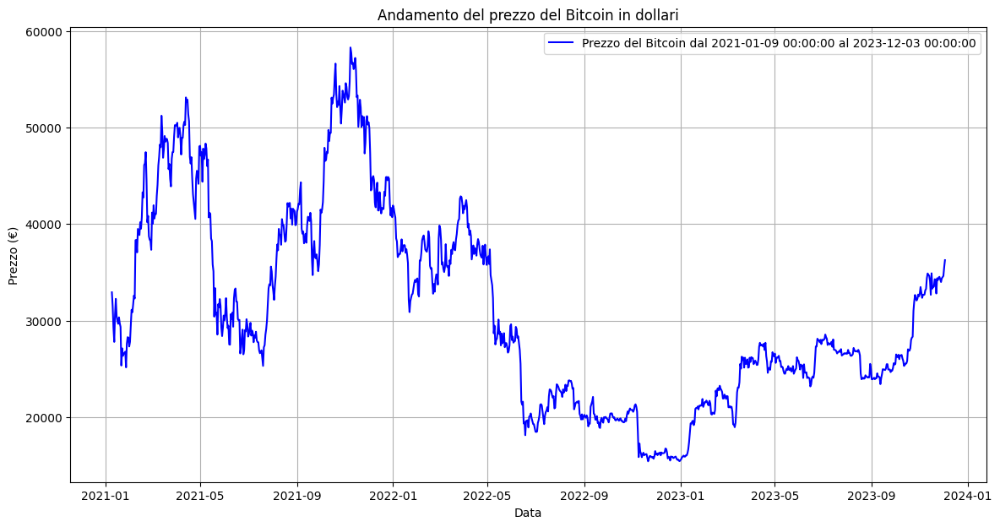

In [ ]:
x = dati['Timestamp']
y = dati['Price']

plt.figure(figsize=(14, 7))
plt.plot(x, y, label=f"Prezzo del Bitcoin dal {str(x.iloc[0])} al {str(x.iloc[-1])}", color='blue')
plt.title('Andamento del prezzo del Bitcoin in dollari')
plt.xlabel('Data')
plt.ylabel('Prezzo (€)')
plt.legend()
plt.grid(True)
plt.show()

<h6> Grafico del prezzo insieme alle medie mobili </h6>

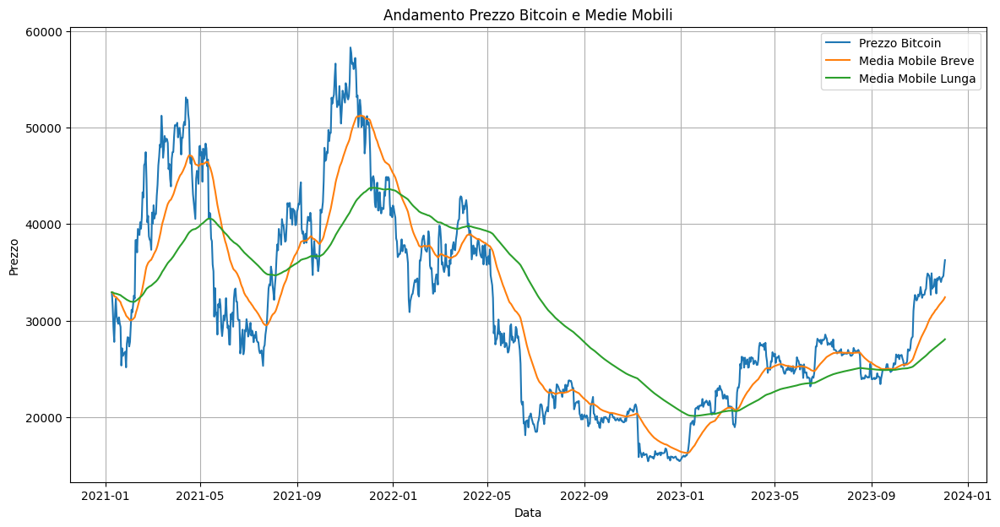

In [ ]:
# Numero di giorni per le medie mobili breve e lunga
n_giorni_breve = 50
n_giorni_lunga = 200

# Variabili booleane per decidere se calcolare la media mobile esponenziale (True) o semplice (False)
esponenziale_breve = True
esponenziale_lunga = True

# Calcolo delle medie mobili
if esponenziale_breve:
    dati['Media Mobile Breve'] = dati['Price'].ewm(span=n_giorni_breve, adjust=False).mean()
else:
    dati['Media Mobile Breve'] = dati['Price'].rolling(window=n_giorni_breve).mean()

if esponenziale_lunga:
    dati['Media Mobile Lunga'] = dati['Price'].ewm(span=n_giorni_lunga, adjust=False).mean()
else:
    dati['Media Mobile Lunga'] = dati['Price'].rolling(window=n_giorni_lunga).mean()

# Creazione del grafico
plt.figure(figsize=(14,7))
plt.plot(dati['Timestamp'], dati['Price'], label='Prezzo Bitcoin')
plt.plot(dati['Timestamp'], dati['Media Mobile Breve'], label='Media Mobile Breve')
plt.plot(dati['Timestamp'], dati['Media Mobile Lunga'], label='Media Mobile Lunga')
plt.title('Andamento Prezzo Bitcoin e Medie Mobili')
plt.xlabel('Data')
plt.ylabel('Prezzo')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
def calcola_RSI(prezzi):
    variazioni = np.diff(prezzi)
    variazioni_positive = [i for i in variazioni if i >= 0]
    variazioni_negative = [i for i in variazioni if i < 0]
    if variazioni_positive == []:
        variazioni_positive.append(0)
    if variazioni_negative == []:
        variazioni_negative.append(0)
    P = np.array(variazioni_positive).mean()
    N = -np.array(variazioni_negative).mean()
    rsi = P / (P + N)
    return rsi

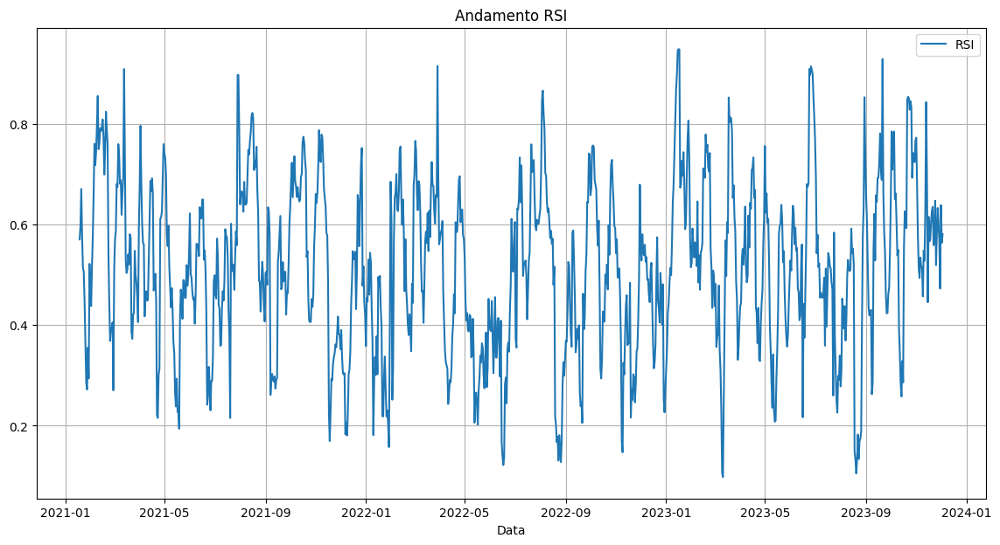

In [ ]:
n_giorni_RSI = 10
valori_RSI = dati['Price'].rolling(window = n_giorni_RSI).apply(calcola_RSI, raw=True) # raw=True fa sì che la funzione calcola_RSI riceva un array numpy invece di una serie pandas, che è necessario per utilizzare np.diff()

plt.figure(figsize=(14,7))
plt.plot(dati['Timestamp'], valori_RSI, label='RSI')
plt.title('Andamento RSI')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()

### Simulazione singola

In [ ]:
# Prova calcolo EMA
prova = pd.Series([2,5,32,1000, 1000, 1000, 1000, 350]) 
prova.ewm(span=5, adjust=False).mean() # adjust=False significa che α viene calcolato come α = 2/(N+1) (valore predefinito, dove N è lo span); la formula che calcola la media mobile esponenziale è EMA_t = (1 - α) EMA_(t-1) + α P_t, dove P_t è il prezzo attuale

0      2.000000
1      3.000000
2     12.666667
3    341.777778
4    561.185185
5    707.456790
6    804.971193
7    653.314129
dtype: float64

In [ ]:
# Parametri fissi
capitale = 1000
bitcoins = 0
ultima_azione = 'Vendita'

# Parametri variabili
scarto_sotto = 0.05
scarto_sopra = -0.12
perc_acquisto = 1
perc_vendita = 1
timeframe = 3
n_giorni_breve = 15
n_giorni_lunga = 70
n_giorni_RSI = 30
soglia_RSI_superiore = 0.6
soglia_RSI_inferiore = 0.4
esponenziale_breve = True # Se è True viene usata la media mobile esponenziale, altrimenti quella semplice
esponenziale_lunga = False

# Calcolo delle medie mobili e dell'RSI
if esponenziale_breve:
    dati['Media Mobile Breve'] = dati['Price'].ewm(span=n_giorni_breve, adjust=False).mean()
else:
    dati['Media Mobile Breve'] = dati['Price'].rolling(window=n_giorni_breve).mean()

if esponenziale_lunga:
    dati['Media Mobile Lunga'] = dati['Price'].ewm(span=n_giorni_lunga, adjust=False).mean()
else:
    dati['Media Mobile Lunga'] = dati['Price'].rolling(window=n_giorni_lunga).mean()

dati['RSI'] = dati['Price'].rolling(window=n_giorni_RSI).apply(calcola_RSI, raw=True)

# Simulazione della strategia di trading
azioni = []
ultime_azioni = []
quantita_euro = []
quantita_bitcoin = []
capitale_lista = []
bitcoins_lista = []
valore_bitcoin_lista = []
portafoglio_lista = []
valore_quantita_euro = 0
valore_quantita_bitcoin = 0
azione = '-'
acquisti_fatti = 0
vendite_fatte = 0

for i in range(n_giorni_RSI, len(dati)):
    if i % timeframe == 0:
        if dati['Media Mobile Breve'].iloc[i] > dati['Media Mobile Lunga'].iloc[i] * (1 + scarto_sopra) and dati['RSI'].iloc[i] < soglia_RSI_inferiore and ultima_azione == 'Vendita':
            prezzo_acquisto = dati['Price'].iloc[i]
            bitcoins_acquistati = (capitale * perc_acquisto) / prezzo_acquisto
            capitale -= prezzo_acquisto * bitcoins_acquistati
            bitcoins += bitcoins_acquistati
            azione = 'Acquisto'
            acquisti_fatti += 1
            ultima_azione = azione
            valore_quantita_euro = prezzo_acquisto * bitcoins_acquistati
            valore_quantita_bitcoin = bitcoins_acquistati
        elif dati['Media Mobile Breve'].iloc[i] < dati['Media Mobile Lunga'].iloc[i] * (1 - scarto_sotto) and dati['RSI'].iloc[i] > soglia_RSI_superiore and ultima_azione == 'Acquisto' and dati['Price'].iloc[i] > prezzo_acquisto:
            prezzo_vendita = dati['Price'].iloc[i]
            bitcoins_venduti = bitcoins * perc_vendita
            capitale += prezzo_vendita * bitcoins_venduti
            bitcoins -= bitcoins_venduti
            azione = 'Vendita'
            vendite_fatte += 1
            ultima_azione = azione
            valore_quantita_euro = prezzo_vendita * bitcoins_venduti
            valore_quantita_bitcoin = bitcoins_venduti
        else:
            azione = '-'
            valore_quantita_euro = 0
            valore_quantita_bitcoin = 0
    else:
        azione = '-'
        valore_quantita_euro = 0
        valore_quantita_bitcoin = 0

    azioni.append(azione)
    ultime_azioni.append(ultima_azione)
    quantita_euro.append(valore_quantita_euro)
    quantita_bitcoin.append(valore_quantita_bitcoin)
    capitale_lista.append(capitale)
    bitcoins_lista.append(bitcoins)
    valore_bitcoin_lista.append(bitcoins * dati['Price'].iloc[i])
    portafoglio_lista.append(capitale + bitcoins * dati['Price'].iloc[i])

rendimento_portafoglio = portafoglio_lista[-1] / portafoglio_lista[0]

tabella_finale = pd.DataFrame({
    'Data': dati['Timestamp'].iloc[n_giorni_RSI:],
    'Prezzo Bitcoin (€)': dati['Price'].iloc[n_giorni_RSI:],
    'Media Mobile Breve': dati['Media Mobile Breve'].iloc[n_giorni_RSI:],
    'Media Mobile Lunga': dati['Media Mobile Lunga'].iloc[n_giorni_RSI:],
    'RSI': dati['RSI'].iloc[n_giorni_RSI:],
    'Azione': azioni,
    'Ultima azione': ultime_azioni,
    '€ acquistati/venduti': quantita_euro,
    'Quantità Bitcoin': quantita_bitcoin,
    'Capitale (€)': capitale_lista,
    'Bitcoin posseduti': bitcoins_lista,
    'Valore Bitcoin (€)': valore_bitcoin_lista,
    'Portafoglio totale (€)': portafoglio_lista
})

In [ ]:
acquisti_fatti, vendite_fatte

(1, 0)

In [ ]:
tabella_finale

,Data,Prezzo Bitcoin (€),Media Mobile Breve,Media Mobile Lunga,RSI,Azione,Ultima azione,€ acquistati/venduti,Quantità Bitcoin,Capitale (€),Bitcoin posseduti,Valore Bitcoin (€),Portafoglio totale (€)
30,2021-02-08,38329.667969,30962.624126,NaN,0.575313,-,Vendita,0.0,0.0,1000.0,0.000000,0.000000,1000.000000
31,2021-02-09,38362.296875,31887.583220,NaN,0.580499,-,Vendita,0.0,0.0,1000.0,0.000000,0.000000,1000.000000
32,2021-02-10,37065.046875,32534.766177,NaN,0.583591,-,Vendita,0.0,0.0,1000.0,0.000000,0.000000,1000.000000
33,2021-02-11,39494.441406,33404.725580,NaN,0.578383,-,Vendita,0.0,0.0,1000.0,0.000000,0.000000,1000.000000
34,2021-02-12,39194.921875,34128.500117,NaN,0.588154,-,Vendita,0.0,0.0,1000.0,0.000000,0.000000,1000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1054,2023-11-29,34379.074219,34000.545278,29920.701283,0.540877,-,Acquisto,0.0,0.0,0.0,0.028808,990.381274,990.381274
1055,2023-11-30,34499.992188,34062.976142,30049.621205,0.536816,-,Acquisto,0.0,0.0,0.0,0.028808,993.864640,993.864640
1056,2023-12-01,34625.015625,34133.231077,30188.238281,0.520140,-,Acquisto,0.0,0.0,0.0,0.028808,997.466275,997.466275
1057,2023-12-02,35518.437500,34306.381880,30339.573242,0.531485,-,Acquisto,0.0,0.0,0.0,0.028808,1023.203684,1023.203684


In [ ]:
tabella_finale[tabella_finale['Azione'] != '-']

,Data,Prezzo Bitcoin (€),Media Mobile Breve,Media Mobile Lunga,RSI,Azione,Ultima azione,€ acquistati/venduti,Quantità Bitcoin,Capitale (€),Bitcoin posseduti,Valore Bitcoin (€),Portafoglio totale (€)
255,2021-09-21,34712.96875,39123.609163,36801.338365,0.397303,Acquisto,Acquisto,1000.0,0.028808,0.0,0.028808,1000.0,1000.0


In [ ]:
print(f'Rendimento del portafoglio: {round(rendimento_portafoglio,2)}')
print(f'Valore medio del portafoglio: {round(np.mean(portafoglio_lista),2)}€')
print(f'Controvalore finale bitcoin: {round(bitcoins_lista[-1] * dati["Price"].iloc[-1],2)}€')
print(f'Capitale finale: {round(capitale_lista[-1],2)}€')

Rendimento del portafoglio: 1.04
Valore medio del portafoglio: 865.94€
Controvalore finale bitcoin: 1044.59€
Capitale finale: 0.0€


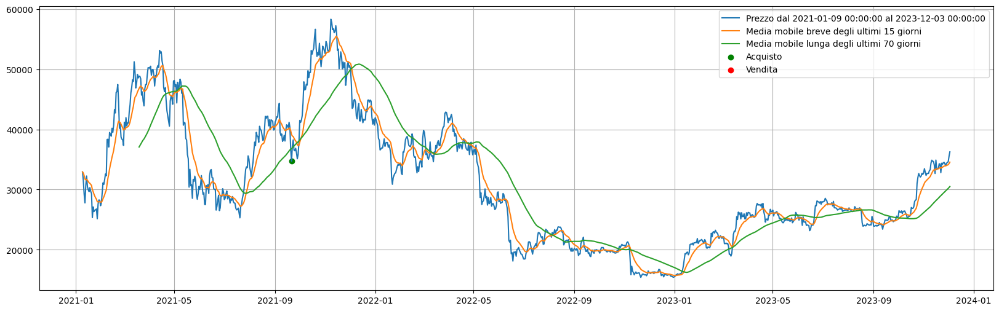

In [ ]:
plt.figure(figsize=(20,6))
plt.plot(dati['Timestamp'], dati['Price'], label=f'Prezzo dal {dati["Timestamp"].iloc[0]} al {dati["Timestamp"].iloc[-1]}')
plt.plot(dati['Timestamp'], dati['Media Mobile Breve'], label=f'Media mobile breve degli ultimi {n_giorni_breve} giorni')
plt.plot(dati['Timestamp'], dati['Media Mobile Lunga'], label=f'Media mobile lunga degli ultimi {n_giorni_lunga} giorni')
acquisti = tabella_finale[tabella_finale['Azione'] == 'Acquisto'].index
vendite = tabella_finale[tabella_finale['Azione'] == 'Vendita'].index
plt.scatter(dati['Timestamp'][acquisti], dati['Price'].iloc[acquisti], color='g', marker='o', label='Acquisto')
plt.scatter(dati['Timestamp'][vendite], dati['Price'].iloc[vendite], color='r', marker='o', label='Vendita')
plt.legend()
plt.grid()
plt.show()

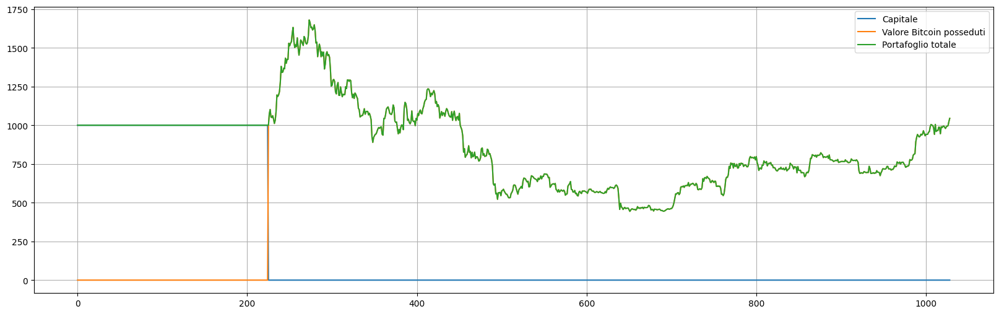

In [ ]:
plt.figure(figsize=(20,6))
plt.plot(capitale_lista, label='Capitale')
plt.plot(valore_bitcoin_lista, label='Valore Bitcoin posseduti')
plt.plot(portafoglio_lista, label='Portafoglio totale')
plt.legend()
plt.grid()
plt.show()

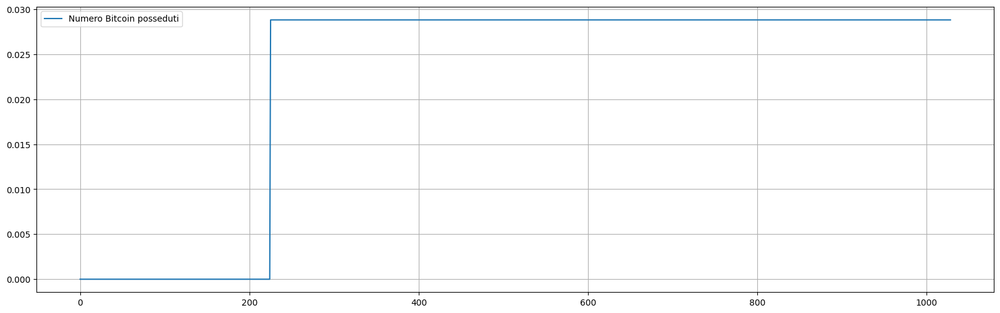

In [ ]:
plt.figure(figsize=(20,6))
plt.plot(bitcoins_lista, label='Numero Bitcoin posseduti')
plt.legend()
plt.grid()
plt.show()